# 1. Expectation-Maximization (EM)

In [1]:
import numpy as np
import seaborn as sns
import scipy.stats as stats
import random
import matplotlib.animation as animation
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.transforms as transforms
from matplotlib.gridspec import GridSpec
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Ellipse
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')

### Set up

We simulate an experiment involving three coins with the following characteristics:

- The likelihood of heads for each coin: 0.3, 0.5, 0.7
- The proportion of each coin in the mix: 0.25, 0.5, 0.25

The experiment includes:
- 200 trials (experiments)
- 100 tosses per trial, using a single randomly selected coin from the mix

We apply two EM algorithms:
- One assumes the data comes from a **Gaussian Mixture Model** with unknown parameters
- The other assumes **a mixture of binomial distributions** with unknown parameters

## Generate data

In [2]:
def generate_data_internal(num_experiments=100, tosses_per_experiment=50, 
                 coin_probs=[0.3, 0.5, 0.7], mixture_probs=[0.25, 0.5, 0.25]):

    np.random.seed(42)
    random.seed(42)
    
    rolls = []
    coin_assignments = []
    
    # tracking ground truth
    coin_counts = {0: {"H": 0, "T": 0},
                   1: {"H": 0, "T": 0},
                   2: {"H": 0, "T": 0}}
    
    for i in range(num_experiments):
        trial = ""
        
        # choose coin based on mixture probabilities
        coin_idx = np.random.choice(3, p=mixture_probs)
        coin_assignments.append(coin_idx)
        p_heads = coin_probs[coin_idx]
        
        # perform tosses for the chosen coin
        for j in range(tosses_per_experiment):
            if random.random() < p_heads:
                trial += "H"
                coin_counts[coin_idx]["H"] += 1
            else:
                trial += "T"
                coin_counts[coin_idx]["T"] += 1
        
        rolls.append(trial)
    
    return rolls, coin_assignments, coin_counts

## EM Algorithm

**The general logic of this part**  

**1. Initialize θ**:
    
$$
\Theta = \{ \theta, \pi \} \quad \text{(Binomial model)}
$$

$$
\Theta = \{ \mu, \sigma, \pi \} \quad \text{(Gaussian model)}
$$  

**2.	Repeat until convergence or max iterations:**

**E-step**  

For each data point $x_i$ (each coin roll result), calculate the responsibilities $\gamma_{ik}$, which represent the probability that data point $x_i$ was generated by component $k$:

- **For Binomial Mixture Model:**

  Each data point is the number of heads out of n tosses. The likelihood for component k is:

  $$ P(x_i | \theta_k) = \text{Binomial}(x_i; n, \theta_k)$$ 

  Then the responsibility is:

  $$ \gamma_{ik} = \frac{ \pi_k \cdot \text{Binomial}(x_i; n, \theta_k) }{ \sum_{j=1}^K \pi_j \cdot \text{Binomial}(x_i; n, \theta_j) } $$


- **For Gaussian Mixture Model:**

    Each data point $x_i$ is a proportion (e.g., of heads). The likelihood for component $k$ is:

    $$ P(x_i | \mu_k, \sigma_k) = \mathcal{N}(x_i; \mu_k, \sigma_k^2) $$

    Then the responsibility is:

    $$ \gamma_{ik} = \frac{ \pi_k \cdot \mathcal{N}(x_i; \mu_k, \sigma_k^2) }{ \sum_{j=1}^K \pi_j \cdot \mathcal{N}(x_i; \mu_j, \sigma_j^2) } $$ 

**M-step**  

Update the model parameters using the responsibilities.

- **For Binomial Mixture Model:**

    Update mixture weights $\pi_k$ and coin biases $\theta_k$:  
    Mixture weights:
    $$ \pi_k = \frac{1}{N} \sum_{i=1}^N \gamma_{ik} $$
    Coin biases:
    $$\theta_k = \frac{ \sum_{i=1}^N \gamma_{ik} \cdot \text{heads}(x_i) }{ \sum_{i=1}^N \gamma_{ik} \cdot n }$$

- **For Gaussian Mixture Model:**

    Update mixture weights $\pi_k$, means $\mu_k$, and variances $\sigma_k^2$:  
    Mixture weights:
    $$ \pi_k = \frac{1}{N} \sum_{i=1}^N \gamma_{ik} $$
    Means:
    $$\mu_k = \frac{ \sum_{i=1}^N \gamma_{ik} \cdot x_i }{ \sum_{i=1}^N \gamma_{ik} }$$
    Variances:
    $$\sigma_k^2 = \frac{ \sum_{i=1}^N \gamma_{ik} \cdot (x_i - \mu_k)^2 }{ \sum_{i=1}^N \gamma_{ik} }$$

$$
\begin{array}{|c|l|}
\hline
\textbf{Symbol} & \textbf{Meaning} \\
\hline
x_i & \text{The } i\text{-th data point} \\
n & \text{Number of trials in each Binomial experiment} \\
N & \text{Total number of data points} \\
K & \text{Total number of components} \\
\theta_k & \text{Probability of heads (Binomial) for component } k \\
\gamma_{ik} & \text{Responsibility of component } k \text{ for data point } x_i \\
\pi_k & \text{Mixture weight of component } k \\
\mu_k & \text{Mean of component } k \text{ (Gaussian model)} \\
\sigma_k^2 & \text{Variance of component } k \text{ (Gaussian model)} \\
\hline
\end{array}
$$

**3. track progress**
- Optionally log the parameters and compute the log-likelihood (how well the model fits the data).
- Stop early if the parameters stop changing significantly (convergence).

In [3]:
def run_em_algorithm(rolls, tosses_per_exp, model="binomial", max_iter=50):
    
    N = len(rolls)
    
    # Initialization
    theta_init = [0.1, 0.3, 0.9]  # initial coin biases
    pi_init = [1/3, 1/3, 1/3]     # initial mixture weights
    
    # more initialization for Gaussian model
    mu_init = theta_init.copy()  # means initialized to the same values as theta
    sigma_init = [0.1, 0.1, 0.1]  # initial standard deviations
    
    # ensure original values remain unchanged
    theta_current = theta_init.copy() 
    pi_current = pi_init.copy()      
    mu_current = mu_init.copy()
    sigma_current = sigma_init.copy()
    
    # tracking history
    theta_history = [theta_current.copy()] 
    pi_history = [pi_current.copy()]
    mu_history = [mu_current.copy()] if model == "gaussian" else []
    sigma_history = [sigma_current.copy()] if model == "gaussian" else []
    ll_history = []
    
    for iteration in range(max_iter):
        
        # E-step
        responsibilities = np.zeros((N, 3))
        expected_counts = {i: {"H": 0, "T": 0} for i in range(3)}
        
        # For Gaussian model, track sufficient statistics
        if model == "gaussian":
            weighted_sum = np.zeros(3)
            weighted_sum_squares = np.zeros(3)
            total_weight = np.zeros(3)
        
        for i, roll in enumerate(rolls):
            
            # calculate the observed proportion of heads
            num_heads = roll.count("H")
            num_tails = len(roll) - num_heads
            x_i = num_heads / len(roll)
            
            # calculate likelihood for each component
            likelihoods = []
            for j in range(3):
                
                # Binomial likelihood
                if model == "binomial":
                    likelihood = stats.binom.pmf(num_heads, len(roll), theta_current[j]) * pi_current[j]
                
                # Gaussian likelihood
                else:
                    mean = mu_current[j]
                    std_dev = sigma_current[j]
                    
                    # ensure numerical stability
                    if std_dev < 1e-8:
                        std_dev = 1e-8
                    
                    likelihood = stats.norm.pdf(x_i, loc=mean, scale=std_dev) * pi_current[j]
                
                likelihoods.append(likelihood)
            
            # normalize
            total_likelihood = sum(likelihoods)
            if total_likelihood > 0:
                for j in range(3):
                    responsibilities[i, j] = likelihoods[j] / total_likelihood
            
            # calculate statistics for the M-step: 
            for j in range(3):
                resp = responsibilities[i, j]
                
                # for Binomial Model: expected number of heads and tails for each component
                if model == "binomial":
                    expected_counts[j]["H"] += resp * num_heads
                    expected_counts[j]["T"] += resp * num_tails
                    
                # for Gaussian Model: weighted sums and squares of observation
                else:
                    weighted_sum[j] += resp * x_i
                    weighted_sum_squares[j] += resp * (x_i ** 2)
                    total_weight[j] += resp
        
        # M-step
        pi_new = []
        theta_new = []
        mu_new = []
        sigma_new = []
        
        for j in range(3):
            # update pi (same for both models)
            component_weight = sum(responsibilities[:, j])
            pi_new.append(component_weight / N)
            
            # special updates for binomial 
            if model == "binomial":
                heads = expected_counts[j]["H"]
                tails = expected_counts[j]["T"]
                total = heads + tails
                
                # update theta
                if total > 0:
                    theta_new.append(heads / total)
                else:
                    theta_new.append(0.5)
                    
            # special updates for Gaussian 
            else:  
                if total_weight[j] > 0:
                    # update mean
                    mu_j = weighted_sum[j] / total_weight[j]
                    mu_new.append(mu_j)
                    
                    # update variance
                    variance_j = (weighted_sum_squares[j] / total_weight[j]) - (mu_j ** 2)
                    
                    # ensure variance is positive
                    if variance_j < 1e-8:
                        variance_j = 1e-8
                    sigma_new.append(np.sqrt(variance_j))
                else:
                    mu_new.append(mu_current[j])
                    sigma_new.append(sigma_current[j])
        
        # normalize pi
        pi_sum = sum(pi_new)
        if pi_sum > 0:
            pi_new = [p / pi_sum for p in pi_new]
        
        # sort to enforce consistent component ordering
        if model == "binomial":
            combined = sorted(zip(theta_new, pi_new))
            theta_new = [item[0] for item in combined]
            pi_new = [item[1] for item in combined]
        else:
            combined = sorted(zip(mu_new, sigma_new, pi_new))
            mu_new = [item[0] for item in combined]
            sigma_new = [item[1] for item in combined]
            pi_new = [item[2] for item in combined]
        
        # calculate log likelihood
        log_likelihood = 0
        for roll in rolls:
            num_heads = roll.count("H")
            x_i = num_heads / len(roll)
            mixture_likelihood = 0
            
            for j in range(3):
                if model == "binomial":
                    component_likelihood = stats.binom.pmf(num_heads, len(roll), theta_new[j]) * pi_new[j]
                else:
                    mean = mu_new[j]
                    std_dev = sigma_new[j]
                    if std_dev < 1e-8:
                        std_dev = 1e-8
                    component_likelihood = stats.norm.pdf(x_i, loc=mean, scale=std_dev) * pi_new[j]
                
                mixture_likelihood += component_likelihood
            
            log_likelihood += np.log(mixture_likelihood) if mixture_likelihood > 0 else -1000
        
        ll_history.append(log_likelihood)
        
        # store history
        if model == "binomial":
            theta_history.append(theta_new.copy())
        else:
            mu_history.append(mu_new.copy())
            sigma_history.append(sigma_new.copy())
        pi_history.append(pi_new.copy())
        
        # Check for convergence
        if model == "binomial":
            param_diff = sum(abs(t1 - t2) for t1, t2 in zip(theta_current, theta_new))
            theta_current = theta_new
        else:
            mu_diff = sum(abs(m1 - m2) for m1, m2 in zip(mu_current, mu_new))
            sigma_diff = sum(abs(s1 - s2) for s1, s2 in zip(sigma_current, sigma_new))
            param_diff = mu_diff + sigma_diff
            mu_current = mu_new
            sigma_current = sigma_new
            
        pi_diff = sum(abs(p1 - p2) for p1, p2 in zip(pi_current, pi_new))
        pi_current = pi_new
        
        if param_diff < 1e-6 and pi_diff < 1e-6:
            print(f"Converged after {iteration+1} iterations")
            break
    
    if model == "binomial":
        return theta_history, pi_history, ll_history
    else:
        return mu_history, sigma_history, pi_history, ll_history

## Visualization & Analysis

In [4]:
rolls, coin_assignments, coin_counts = generate_data_internal(
    num_experiments=200,
    tosses_per_experiment=100,
    coin_probs=[0.3, 0.5, 0.7],
    mixture_probs=[0.25, 0.5, 0.25]
)

In [5]:
# Run both models
theta_history, pi_history_binom, ll_history_binom = run_em_algorithm(rolls, 50, model="binomial")
mu_history, sigma_history, pi_history_gauss, ll_history_gauss = run_em_algorithm(rolls, 50, model="gaussian")

# Get the final parameters
final_thetas = theta_history[-1]
final_mus = mu_history[-1]
final_sigmas = sigma_history[-1]
final_pi_binom = pi_history_binom[-1]
final_pi_gauss = pi_history_gauss[-1]

# Extract proportion of heads for each experiment
head_proportions = [roll.count("H") / len(roll) for roll in rolls]

# True parameters (from the data generation)
true_probs = [0.3, 0.5, 0.7]
true_mix_weights = [0.25, 0.5, 0.25]
true_colors = ['red', 'green', 'blue']

Converged after 17 iterations
Converged after 44 iterations


### 1. Histogram of head proportions with model distributions overlaid

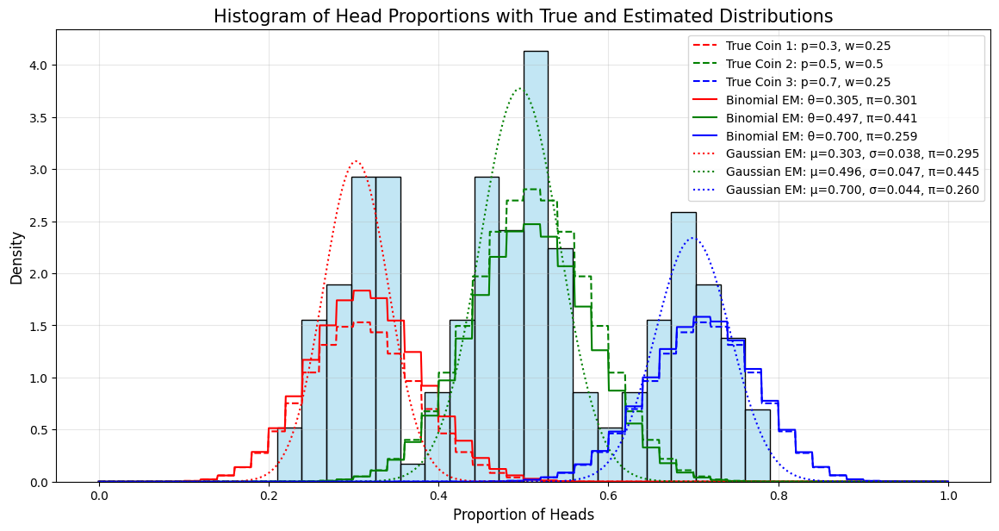

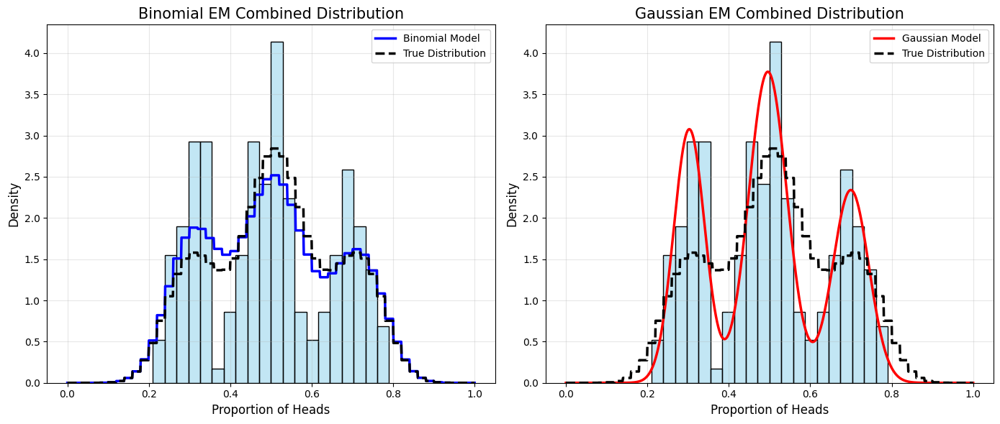

In [6]:
plt.figure(figsize=(14, 10))
gs = GridSpec(2, 2, height_ratios=[3, 1])

# Histogram and model comparison
ax1 = plt.subplot(gs[0, :])
sns.histplot(head_proportions, bins=20, kde=False, stat='density', color='skyblue', alpha=0.5, ax=ax1)

# Plot the true mixture model components
x = np.linspace(0, 1, 1000)

# Plot binomial approximations of true distributions
for i, (prob, weight) in enumerate(zip(true_probs, true_mix_weights)):
    # Calculate binomial PMF and convert to continuous density for visualization
    y_binom = np.array([stats.binom.pmf(int(p * 50), 50, prob) * 50 for p in x])
    y_binom = y_binom * weight  # Scale by mixture weight
    
    # Plot individual components
    ax1.plot(x, y_binom, color=true_colors[i], linestyle='--', 
             label=f'True Coin {i+1}: p={prob}, w={weight}')

# Plot estimated models
# Binomial Model
for i, (theta, pi) in enumerate(zip(final_thetas, final_pi_binom)):
    y_binom = np.array([stats.binom.pmf(int(p * 50), 50, theta) * 50 for p in x])
    y_binom = y_binom * pi
    ax1.plot(x, y_binom, color=true_colors[i], linestyle='-', 
             label=f'Binomial EM: θ={theta:.3f}, π={pi:.3f}')

# Gaussian Model
for i, (mu, sigma, pi) in enumerate(zip(final_mus, final_sigmas, final_pi_gauss)):
    y_gauss = stats.norm.pdf(x, loc=mu, scale=sigma) * pi
    ax1.plot(x, y_gauss, color=true_colors[i], linestyle=':', 
             label=f'Gaussian EM: μ={mu:.3f}, σ={sigma:.3f}, π={pi:.3f}')

ax1.set_title('Histogram of Head Proportions with True and Estimated Distributions', fontsize=15)
ax1.set_xlabel('Proportion of Heads', fontsize=12)
ax1.set_ylabel('Density', fontsize=12)
ax1.legend(loc='upper right', fontsize=10)
ax1.grid(True, alpha=0.3)
plt.show()



plt.figure(figsize=(14, 6))

# Combined distributions
ax11 = plt.subplot(121)
sns.histplot(head_proportions, bins=20, kde=False, stat='density', color='skyblue', alpha=0.5, ax=ax11)

# Combined binomial model
combined_binom = np.zeros_like(x)
for i, (theta, pi) in enumerate(zip(final_thetas, final_pi_binom)):
    y_binom = np.array([stats.binom.pmf(int(p * 50), 50, theta) * 50 for p in x])
    combined_binom += y_binom * pi
ax11.plot(x, combined_binom, color='blue', linewidth=2.5, label='Binomial Model')

# True combined distribution
combined_true = np.zeros_like(x)
for i, (prob, weight) in enumerate(zip(true_probs, true_mix_weights)):
    y_binom = np.array([stats.binom.pmf(int(p * 50), 50, prob) * 50 for p in x])
    combined_true += y_binom * weight
ax11.plot(x, combined_true, color='black', linestyle='--', linewidth=2.5, label='True Distribution')

ax11.set_title('Binomial EM Combined Distribution', fontsize=15)
ax11.set_xlabel('Proportion of Heads', fontsize=12)
ax11.set_ylabel('Density', fontsize=12)
ax11.legend(fontsize=10)
ax11.grid(True, alpha=0.3)

# Combined Gaussian model
ax12 = plt.subplot(122)
sns.histplot(head_proportions, bins=20, kde=False, stat='density', color='skyblue', alpha=0.5, ax=ax12)

combined_gauss = np.zeros_like(x)
for i, (mu, sigma, pi) in enumerate(zip(final_mus, final_sigmas, final_pi_gauss)):
    y_gauss = stats.norm.pdf(x, loc=mu, scale=sigma) * pi
    combined_gauss += y_gauss
ax12.plot(x, combined_gauss, color='red', linewidth=2.5, label='Gaussian Model')
ax12.plot(x, combined_true, color='black', linestyle='--', linewidth=2.5, label='True Distribution')

ax12.set_title('Gaussian EM Combined Distribution', fontsize=15)
ax12.set_xlabel('Proportion of Heads', fontsize=12)
ax12.set_ylabel('Density', fontsize=12)
ax12.legend(fontsize=10)
ax12.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('em_model_comparison_5.png', dpi=300)


plt.show()

#### In general: 
In our initial experiments, we designed 100 trials × 50 rolls. Under this setting, the Binomial Mixture Model was able to converge quite well to the true bias of the coin, whereas the Gaussian Mixture Model still exhibited some bias. After doubling the sample size to 200 trials × 100 rolls, the performance of both models became much more similar. This suggests that with a larger sample size, the EM algorithm converges more consistently to the true parameters, regardless of the chosen modeling approach.

Despite both models doing a relatively good job in estimating the true coin biases, the estimated mixture weights for all three components were not accurate. 

This inaccuracy probably stems from the inherent challenge in estimating mixture weights—which determine how much each component (coin) contributes to the overall distribution.When the true mixture weights are very close or identical, as in this case, the model may treat the components as being more similar than they actually are. This leads to imprecise weight estimates, particularly in the early iterations of the EM algorithm, where the model is still adjusting to separate the influence of each component. This difficulty is exacerbated when the components overlap in value, making it harder for the model to clearly distinguish their individual contributions.


#### For Gaussian

After doubling the number of trials to 100 × 50 rolls, the estimated mean of the Gaussian component becomes closer to the true coin bias, and the variance shrinks, indicating that our uncertainty about the bias is reduced—we are more “confident” about where the bias lies.

This discrepancy likely arises from the fact that the true data-generating process is inherently discrete (a binomial distribution), while we are forcing it into a continuous Gaussian framework. In other words, as the sample size grows, the GMM achieves a lower estimated variance, but it may also start to “overfit” its own simplified assumptions about the data. This overconfidence can amplify the structural mismatch between the Gaussian approximation and the actual, non-Gaussian distribution, highlighting the model’s inherent limitations.

####  For Binomial

In contrast, the BMM was more naturally aligned with the true data-generating process. As the data grew, the BMM’s estimated mean approached the true coin bias with greater accuracy. Since the binomial distribution directly models the process of coin flips, which are discrete and bounded, the model was able to capture the data’s inherent characteristics more effectively. Unlike the GMM, which can only approximate the discrete nature of the data with a continuous distribution, the binomial model maintains a closer match to the real distribution, avoiding the risk of overfitting or misrepresenting the data’s underlying structure.



### 2. Log-likelihood convergence 

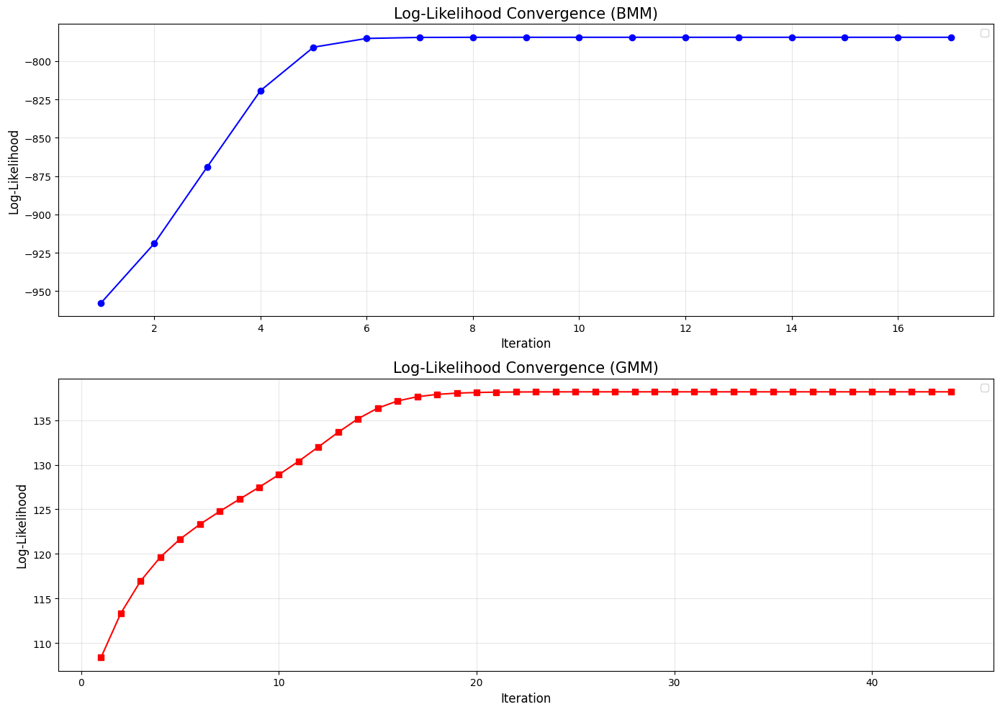

In [7]:
plt.figure(figsize=(14, 10))

# Create the first subplot for the Binomial EM
ax1 = plt.subplot(2, 1, 1)
iterations_binom = range(1, len(ll_history_binom) + 1)
ax1.plot(iterations_binom, ll_history_binom, 'o-', color='blue')
ax1.set_title('Log-Likelihood Convergence (BMM)', fontsize=15)
ax1.set_xlabel('Iteration', fontsize=12)
ax1.set_ylabel('Log-Likelihood', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(fontsize=10)

# Create the second subplot for the Gaussian EM
ax2 = plt.subplot(2, 1, 2)
iterations_gauss = range(1, len(ll_history_gauss) + 1)
ax2.plot(iterations_gauss, ll_history_gauss, 's-', color='red')
ax2.set_title('Log-Likelihood Convergence (GMM)', fontsize=15)
ax2.set_xlabel('Iteration', fontsize=12)
ax2.set_ylabel('Log-Likelihood', fontsize=12)
ax2.grid(True, alpha=0.3)
ax2.legend(fontsize=10)

# Adjust the layout for better visibility
plt.tight_layout()

# Save and show the plots
plt.savefig('em_model_comparison_separate.png', dpi=300)
plt.show()

The large difference in log-likelihood values between the GMM and BMM is likely due to the inherent differences in how the likelihoods are computed for each model, rather than solely due to their convergence behavior. 

However, in the case of the 3-coin model, the BMM converges significantly faster than the GMM. The BMM stabilizes around the 6th iteration, whereas the GMM only starts to stabilize around the 17th iteration.

### 3. Parameter convergence


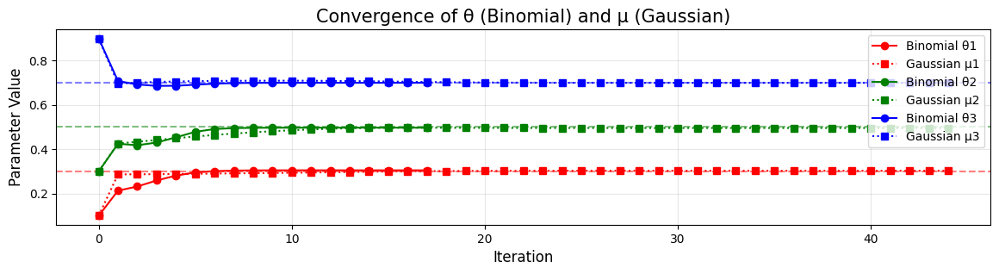

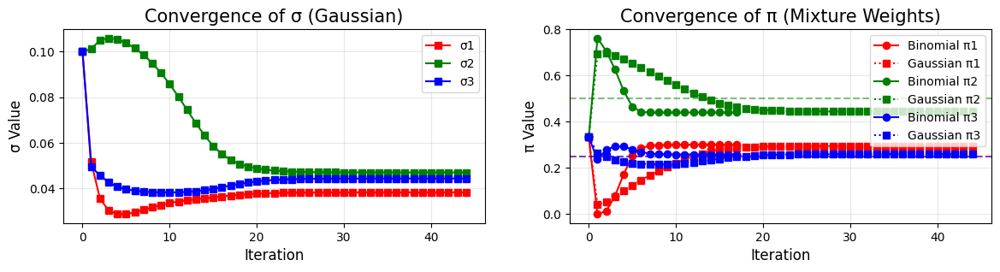

In [8]:
plt.figure(figsize=(14, 10))
gs = GridSpec(3, 2)

# Plot theta/mu convergence - FIXED: Separate iteration counts
ax3 = plt.subplot(gs[0, :])
for i in range(3):
    theta_values = [theta_history[j][i] for j in range(len(theta_history))]
    mu_values = [mu_history[j][i] for j in range(len(mu_history))]
    ax3.plot(range(len(theta_values)), theta_values, 'o-', color=true_colors[i], label=f'Binomial θ{i+1}')
    ax3.plot(range(len(mu_values)), mu_values, 's-', color=true_colors[i], linestyle=':', label=f'Gaussian μ{i+1}')
    # Add horizontal line for true value
    ax3.axhline(y=true_probs[i], color=true_colors[i], linestyle='--', alpha=0.5)

ax3.set_title('Convergence of θ (Binomial) and μ (Gaussian)', fontsize=15)
ax3.set_xlabel('Iteration', fontsize=12)
ax3.set_ylabel('Parameter Value', fontsize=12)
ax3.legend(fontsize=10)
ax3.grid(True, alpha=0.3)

# Plot sigma convergence (Gaussian only)
plt.figure(figsize=(14, 10))
ax4 = plt.subplot(gs[1, 0])
for i in range(3):
    sigma_values = [sigma_history[j][i] for j in range(len(sigma_history))]
    ax4.plot(range(len(sigma_values)), sigma_values, 's-', color=true_colors[i], label=f'σ{i+1}')

ax4.set_title('Convergence of σ (Gaussian)', fontsize=15)
ax4.set_xlabel('Iteration', fontsize=12)
ax4.set_ylabel('σ Value', fontsize=12)
ax4.legend(fontsize=10)
ax4.grid(True, alpha=0.3)

# Plot pi convergence - FIXED: Separate iteration counts
ax5 = plt.subplot(gs[1, 1])
for i in range(3):
    pi_values_binom = [pi_history_binom[j][i] for j in range(len(pi_history_binom))]
    pi_values_gauss = [pi_history_gauss[j][i] for j in range(len(pi_history_gauss))]
    ax5.plot(range(len(pi_values_binom)), pi_values_binom, 'o-', color=true_colors[i], label=f'Binomial π{i+1}')
    ax5.plot(range(len(pi_values_gauss)), pi_values_gauss, 's-', color=true_colors[i], linestyle=':', label=f'Gaussian π{i+1}')
    # Add horizontal line for true value
    ax5.axhline(y=true_mix_weights[i], color=true_colors[i], linestyle='--', alpha=0.5)

ax5.set_title('Convergence of π (Mixture Weights)', fontsize=15)
ax5.set_xlabel('Iteration', fontsize=12)
ax5.set_ylabel('π Value', fontsize=12)
ax5.legend(fontsize=10)
ax5.grid(True, alpha=0.3)

#### Convergence of θ and μ: 

Convergence of θ and μ: The parameters in both models start from initial estimates and generally converge to stable values after around 5–10 iterations. In the Binomial model, θ tends to converge faster than μ in the Gaussian Mixture Model, especially when the number of trials and tosses is relatively small—this difference becomes more pronounced in such cases. Nevertheless, both models are able to estimate the true coins bias reasonably well.\

#### Convergence of σ:

In the original 100 trials × 50 tosses setting, none of the σ values were able to converge. However, in this case, all σ values begin to converge around the 20th iteration. Moreover, the three values are relatively small and very close to each other.

#### Convergence of π:

The convergence paths of all the π values are quite similar in both models. Among all the components, we can observe that the BMM converges faster than the GMM. Interestingly, only the third component ends up with a relatively accurate estimate of its mixture weight. However, to be honest, we haven’t found a clear explanation for this phenomenon.

In our experiments, we initially set the parameters θ and μ to [0.4, 0.5, 0.6]. Under this initialization, all the mixture weights π in the GMM failed to converge even after 30 iterations, showing no clear trend toward stability.
However, the π values in the BMM were not affected by this initialization and converged relatively quickly. This maybe due to: 
    
- The BMM is inherently more suitable for this type of data (discrete, binomially distributed). Even when the initial parameters are similar, it can quickly distinguish the contribution of each component, allowing the mixture weights (π) to stabilize rapidly.

- The GMM is designed for continuous data. It struggles when the initial means (μ) are close, as this leads to greater overlap between components. This overlap makes it harder to assign data points clearly to a specific component, causing the mixture weights π to update slowly—or even fail to converge. Additionally, GMM must estimate the standard deviation (σ) for each component, increasing the parameter space and the complexity of the EM trajectory. As a result, the algorithm is more prone to getting stuck in local optima or lingering in uncertainty during early iterations.

### 4. Scatter plot of data with model predictions


Binomial EM Accuracy: 96.5%
Gaussian EM Accuracy: 97.5%


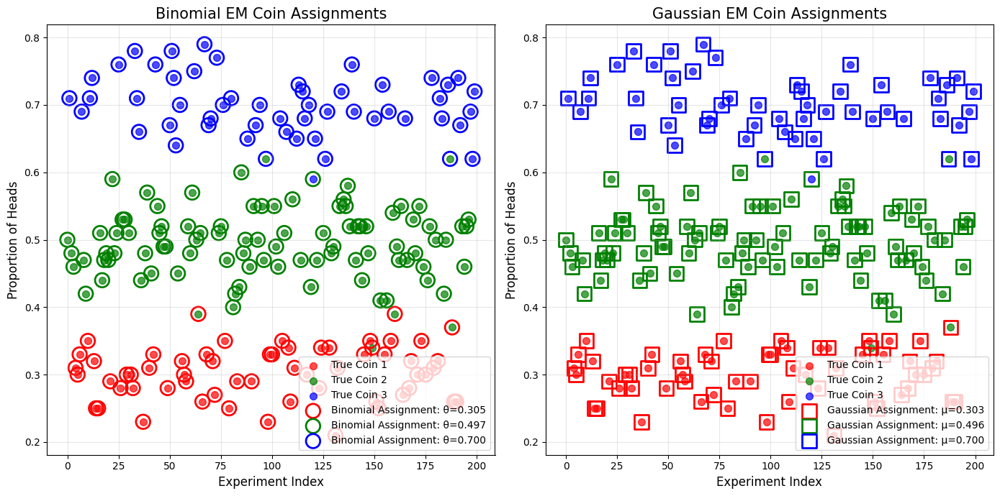

In [9]:
import numpy as np
from scipy import stats

# Assuming the necessary data (`rolls`, `coin_assignments`, `head_proportions`, `true_colors`, `final_thetas`, etc.) are already defined.

# Calculate responsibilities for Binomial model
responsibilities_binom = np.zeros((len(rolls), 3))
for i, roll in enumerate(rolls):
    num_heads = roll.count("H")
    likelihoods = []
    for j in range(3):
        likelihood = stats.binom.pmf(num_heads, len(roll), final_thetas[j]) * final_pi_binom[j]
        likelihoods.append(likelihood)
    
    total_likelihood = sum(likelihoods)
    if total_likelihood > 0:
        for j in range(3):
            responsibilities_binom[i, j] = likelihoods[j] / total_likelihood

# Calculate responsibilities for Gaussian model
responsibilities_gauss = np.zeros((len(rolls), 3))
for i, roll in enumerate(rolls):
    x_i = roll.count("H") / len(roll)
    likelihoods = []
    for j in range(3):
        likelihood = stats.norm.pdf(x_i, loc=final_mus[j], scale=final_sigmas[j]) * final_pi_gauss[j]
        likelihoods.append(likelihood)
    
    total_likelihood = sum(likelihoods)
    if total_likelihood > 0:
        for j in range(3):
            responsibilities_gauss[i, j] = likelihoods[j] / total_likelihood

# Get max assignment for both models
binom_assignments = np.argmax(responsibilities_binom, axis=1)
gauss_assignments = np.argmax(responsibilities_gauss, axis=1)

# Calculate agreement with true assignments
binom_correct = np.sum(binom_assignments == coin_assignments)
gauss_correct = np.sum(gauss_assignments == coin_assignments)

# Calculate accuracies
binom_accuracy = binom_correct / len(rolls) * 100
gauss_accuracy = gauss_correct / len(rolls) * 100

# Print the accuracies
print(f'Binomial EM Accuracy: {binom_accuracy:.1f}%')
print(f'Gaussian EM Accuracy: {gauss_accuracy:.1f}%')

plt.figure(figsize=(14, 7))

# Create scatter plot of actual data points
ax7 = plt.subplot(121)
for coin in range(3):
    coin_indices = [i for i, c in enumerate(coin_assignments) if c == coin]
    coin_props = [head_proportions[i] for i in coin_indices]
    coin_counts = [1] * len(coin_indices)  # Size of point
    ax7.scatter(coin_indices, coin_props, s=50, color=true_colors[coin], alpha=0.7, 
                label=f'True Coin {coin+1}')

# Plot binomial model assignments
for i, (theta, pi) in enumerate(zip(final_thetas, final_pi_binom)):
    assigned_indices = [j for j, a in enumerate(binom_assignments) if a == i]
    assigned_props = [head_proportions[j] for j in assigned_indices]
    ax7.scatter(assigned_indices, assigned_props, s=200, facecolors='none', 
                edgecolors=true_colors[i], linewidth=2, marker='o', 
                label=f'Binomial Assignment: θ={theta:.3f}')

ax7.set_title('Binomial EM Coin Assignments', fontsize=15)
ax7.set_xlabel('Experiment Index', fontsize=12)
ax7.set_ylabel('Proportion of Heads', fontsize=12)
ax7.grid(True, alpha=0.3)
ax7.legend(fontsize=10)


# Plot Gaussian model assignments
ax8 = plt.subplot(122)
for coin in range(3):
    coin_indices = [i for i, c in enumerate(coin_assignments) if c == coin]
    coin_props = [head_proportions[i] for i in coin_indices]
    ax8.scatter(coin_indices, coin_props, s=50, color=true_colors[coin], alpha=0.7, 
                label=f'True Coin {coin+1}')
# Plot Gaussian model assignments
for i, (mu, sigma, pi) in enumerate(zip(final_mus, final_sigmas, final_pi_gauss)):
    assigned_indices = [j for j, a in enumerate(gauss_assignments) if a == i]
    assigned_props = [head_proportions[j] for j in assigned_indices]
    ax8.scatter(assigned_indices, assigned_props, s=200, facecolors='none', 
                edgecolors=true_colors[i], linewidth=2, marker='s', 
                label=f'Gaussian Assignment: μ={mu:.3f}')

ax8.set_title('Gaussian EM Coin Assignments', fontsize=15)
ax8.set_xlabel('Experiment Index', fontsize=12)
ax8.set_ylabel('Proportion of Heads', fontsize=12)
ax8.grid(True, alpha=0.3)
ax8.legend(fontsize=10)

plt.tight_layout()

#### Takehome message: 

Both models achieve high accuracy in this case, with the GMM showing slightly higher accuracy.

However, for the GMM model (the following two experiments are not shown in this plot): 
- when the dataset was limited to only 100 trials × 50 tosses, the accuracy of the GMM dropped to 85%.
- when the initial parameters θ and μ were set to [0.4, 0.5, 0.6], both models reached an accuracy of 94%.

This suggests that the GMM may be more sensitive to smaller sample sizes and initialization. 

### 5. Animation

Create 2D representation of the data for visualization
We'll use the proportion of heads as one dimension
For the second dimension, we'll use a jittered version of the same data
This creates a visualization that spreads out points with the same proportion

In [10]:
def create_em_animation(rolls, tosses_per_exp, parameter_history, model="binomial", interval=50, 
                        figsize=(10, 8), samples_to_plot=100):    
    
    # calculate the fraction of heads in each experiment
    proportions = [roll.count('H') / len(roll) for roll in rolls]

    # to avoid overlapping points with the same proportions, add a small random "jitter" to the y-values.
    jitter = np.random.normal(0, 0.02, len(proportions))
    y_data = np.array(proportions) + jitter
    
    # If we have more data points than we want to plot, randomly select some
    if len(proportions) > samples_to_plot:
        indices = np.random.choice(len(proportions), samples_to_plot, replace=False)
        x_plot = np.array(proportions)[indices]
        y_plot = y_data[indices]
    else:
        indices = None  # Not needed
        x_plot = np.array(proportions)
        y_plot = y_data
    
    # extract parameter history
    if model == "binomial":
        theta_history, pi_history, ll_history = parameter_history
        param_history = theta_history
    else:
        mu_history, sigma_history, pi_history, ll_history = parameter_history
        param_history = mu_history
    
    fig, ax = plt.subplots(figsize=figsize)
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c']
    
    # Initialize scatter plot points and ellipses
    scatters = []
    ellipses = []
    
    # compute responsibilities for each iteration
    def compute_resp_for_iteration(iteration):
        if model == "binomial":
            thetas = theta_history[iteration]
            pis = pi_history[iteration]
            
            responsibilities = np.zeros((len(proportions), 3))
            
            for i, p in enumerate(proportions):
                likelihoods = []
                for j in range(3):
                    heads = int(p * tosses_per_exp)
                    likelihood = stats.binom.pmf(heads, tosses_per_exp, thetas[j]) * pis[j]
                    likelihoods.append(likelihood)
                
                # Normalize
                total = sum(likelihoods)
                if total > 0:
                    responsibilities[i] = [l / total for l in likelihoods]
                
            return responsibilities
        else:
            mus = mu_history[iteration]
            sigmas = sigma_history[iteration]
            pis = pi_history[iteration]
            
            responsibilities = np.zeros((len(proportions), 3))
            
            for i, p in enumerate(proportions):
                likelihoods = []
                for j in range(3):
                    likelihood = stats.norm.pdf(p, loc=mus[j], scale=sigmas[j]) * pis[j]
                    likelihoods.append(likelihood)
                
                # normalize
                total = sum(likelihoods)
                if total > 0:
                    responsibilities[i] = [l / total for l in likelihoods]
                
            return responsibilities
    
    # update the plot for each frame
    def update(frame):
        ax.clear()
        
        # extract parameters for this iteration
        iteration = min(frame, len(param_history) - 1)
        
        if model == "binomial":
            thetas = theta_history[iteration]
            pis = pi_history[iteration]
            params = (thetas, pis)
            
            title = f"Iteration {iteration}\n"
            title += f"θ = [{thetas[0]:.3f}, {thetas[1]:.3f}, {thetas[2]:.3f}]\n"
            title += f"π = [{pis[0]:.3f}, {pis[1]:.3f}, {pis[2]:.3f}]"
        else:
            mus = mu_history[iteration]
            sigmas = sigma_history[iteration]
            pis = pi_history[iteration]
            params = (mus, sigmas, pis)
            
            title = f"Iteration {iteration}\n"
            title += f"μ = [{mus[0]:.3f}, {mus[1]:.3f}, {mus[2]:.3f}]\n"
            title += f"σ = [{sigmas[0]:.3f}, {sigmas[1]:.3f}, {sigmas[2]:.3f}]\n"
            title += f"π = [{pis[0]:.3f}, {pis[1]:.3f}, {pis[2]:.3f}]"
        
        ax.set_title(title)
        
        # Compute responsibilities for this iteration
        responsibilities = compute_resp_for_iteration(iteration)
        
        # Get the responsibilities for the points we're plotting
        if len(proportions) > samples_to_plot:
            # Ensure indices is defined
            resp_plot = responsibilities[indices]
        else:
            resp_plot = responsibilities
        
        # Determine dominant component for each point
        dominant = np.argmax(resp_plot, axis=1)
        
        # Plot data points colored by dominant component
        for j in range(3):
            mask = (dominant == j)
            ax.scatter(x_plot[mask], y_plot[mask], c=colors[j], alpha=0.7, 
                      edgecolor='k', linewidth=0.5, s=40)
        
        # Draw confidence ellipses for each component
        for j in range(3):
            if model == "binomial":
                # For binomial, estimate mean and variance
                mean_x = thetas[j]
                var_x = thetas[j] * (1 - thetas[j]) / tosses_per_exp
                
                # For y-axis (jittered version), adjust variance
                mean_y = mean_x  # Same center
                var_y = var_x + 0.02**2  # Added jitter variance
                
                # Calculate standard deviations and correlation
                std_x = np.sqrt(var_x)
                std_y = np.sqrt(var_y)
                corr = 0.6  # Moderate positive correlation
                
                # Calculate covariance
                cov_xy = corr * std_x * std_y
                
                # Covariance matrix
                cov = np.array([[var_x, cov_xy], [cov_xy, var_y]])
                
            else:
                # For Gaussian model, use parameters directly
                mean_x = mus[j]
                std_x = sigmas[j]
                
                mean_y = mean_x  # Same center
                std_y = np.sqrt(std_x**2 + 0.02**2)  # Added jitter variance
                
                # Moderate positive correlation
                corr = 0.6
                cov_xy = corr * std_x * std_y
                
                # Covariance matrix
                cov = np.array([[std_x**2, cov_xy], [cov_xy, std_y**2]])
            
            # Calculate eigenvalues and eigenvectors
            vals, vecs = np.linalg.eigh(cov)
            order = vals.argsort()[::-1]
            vals = vals[order]
            vecs = vecs[:, order]
            
            # Calculate angle in degrees
            theta = np.degrees(np.arctan2(*vecs[:, 0][::-1]))
            
            # Calculate width and height (2 and 3 standard deviations)
            w, h = 2 * np.sqrt(vals) * 2  # 2 sigma
            w2, h2 = 2 * np.sqrt(vals) * 3  # 3 sigma
            
            # Create ellipses
            for nsig, alpha in [(3, 0.15), (2, 0.35)]:
                width = w if nsig == 2 else w2
                height = h if nsig == 2 else h2
                
                ellipse = Ellipse(xy=(mean_x, mean_y), width=width, height=height,
                                 angle=theta, edgecolor=colors[j], fc=colors[j],
                                 alpha=alpha * pis[j] / max(pis))
                ax.add_patch(ellipse)
        
        # Set plot limits and labels
        margin = 0.1
        ax.set_xlim(max(0, min(x_plot) - margin), min(1, max(x_plot) + margin))
        ax.set_ylim(max(0, min(y_plot) - margin), min(1, max(y_plot) + margin))
        ax.set_xlabel('Proportion of Heads')
        ax.set_ylabel('Jittered Proportion')
        ax.grid(True, alpha=0.3)
        
        # Plot x and y values for each component's mean
        for j in range(3):
            if model == "binomial":
                ax.plot(thetas[j], thetas[j], 'o', markersize=10, 
                       markeredgecolor='k', markerfacecolor=colors[j])
                
                # Add crosshairs
                ax.axhline(y=thetas[j], color=colors[j], linestyle='--', alpha=0.5)
                ax.axvline(x=thetas[j], color=colors[j], linestyle='--', alpha=0.5)
            else:
                ax.plot(mus[j], mus[j], 'o', markersize=10, 
                       markeredgecolor='k', markerfacecolor=colors[j])
                
                # Add crosshairs
                ax.axhline(y=mus[j], color=colors[j], linestyle='--', alpha=0.5)
                ax.axvline(x=mus[j], color=colors[j], linestyle='--', alpha=0.5)
        
        return ax
    
    # Create the animation
    frames = len(param_history)
    anim = animation.FuncAnimation(fig, update, frames=frames, interval=interval, blit=False)
    
    # Close the standalone figure to prevent duplicate displays
    plt.close(fig)
    
    return anim



def run_and_animate_em(rolls, tosses_per_exp, model="binomial", max_iter=30, interval=200):
    # Run the EM algorithm
    if model == "binomial":
        theta_history, pi_history, ll_history = run_em_algorithm(
            rolls, tosses_per_exp, model=model, max_iter=max_iter
        )
        parameter_history = (theta_history, pi_history, ll_history)
    else:
        mu_history, sigma_history, pi_history, ll_history = run_em_algorithm(
            rolls, tosses_per_exp, model=model, max_iter=max_iter
        )
        parameter_history = (mu_history, sigma_history, pi_history, ll_history)
    
    # Create animation
    anim = create_em_animation(
        rolls, tosses_per_exp, parameter_history, model=model, interval=interval
    )
    
    return anim, parameter_history


def save_and_display_animation(anim, filename='em_algorithm_animation.mp4', fps=5, display=True):
    anim.save(filename, writer='ffmpeg', fps=fps, dpi=100)
    print(f"Animation saved to {filename}")
    
    # Display in notebook if requested
    if display: 
        return HTML(anim.to_jshtml())
    return None

In [11]:
# Run algorithm and create animation
anim, params = run_and_animate_em(
    rolls, 
    tosses_per_exp=50, 
    model="binomial", 
    max_iter=30,
    interval=300  # Slower animation (300ms between frames)
)

# Save and display
display_anim = save_and_display_animation(anim, 'coin_em_animation_binomial.mp4', fps=3)
display_anim  # Display in notebook

Converged after 17 iterations
Animation saved to coin_em_animation_binomial.mp4


In [12]:
anim, params = run_and_animate_em(
    rolls, 
    tosses_per_exp=50, 
    model="gaussian", 
    max_iter=100,
    interval=300  # Slower animation (300ms between frames)
)

# Save and display
display_anim = save_and_display_animation(anim, 'coin_em_animation_gaussian.mp4', fps=3)
display_anim  # Display in notebook

Converged after 44 iterations
Animation saved to coin_em_animation_gaussian.mp4


#### Takehome message:

The Binomial Mixture Model (BMM) stabilizes after around 10 iterations, indicating a relatively fast and steady convergence.  
The Gaussian Mixture Model (GMM) takes around 25 iterations before the cluster assignments become stable.


#### For Binomial: 
The parameter space is more constrained (θ is bounded between 0 and 1), which makes the model more robust to initializations, resulting in typically stable updates.

#### For Gaussian:

Even with similar initial values for both models, the Gaussian model is inherently slower to converge because of its continuous parameters (μ and σ). These parameters have more degrees of freedom and are more susceptible to fluctuating, leading to slower stabilization of cluster assignments.



# 2. Optional Task: Unlucky Optimization Competition


In [13]:
import random
import math
import numpy as np
from tqdm import  tqdm

# --- Constants ---
TRUE_THETA_A = 0.9
TRUE_THETA_B = 0.1
NUM_GROUPS = 5
FLIPS_PER_GROUP = 25
TOTAL_FLIPS = NUM_GROUPS * FLIPS_PER_GROUP
NUM_SIMULATIONS = 1000000 # Adjust based on how much time you have

# --- Helper Functions ---

def simulate_one_sequence():
    """
    Generates one 125-flip sequence according to the rules.
    Returns the sequence (list of 0s/1s) and the origins (list of 'A'/'B').
    """
    sequence = []
    group_origins = [] # Stores 'A' or 'B' for each group

    for _ in range(NUM_GROUPS):
        # 1. Choose coin for this group (50/50 probability)
        chosen_coin = random.choice(['A', 'B'])
        group_origins.append(chosen_coin)

        # 2. Determine true bias for the chosen coin
        true_bias = TRUE_THETA_A if chosen_coin == 'A' else TRUE_THETA_B

        # 3. Simulate FLIPS_PER_GROUP flips using this bias
        #    Using numpy.random.binomial is efficient
        flips = np.random.binomial(1, true_bias, size=FLIPS_PER_GROUP)
        sequence.extend(flips.tolist()) # Add flips (0s/1s) to the main sequence

    return sequence, group_origins

def calculate_mle(sequence, group_origins):
    """
    Calculates MLE estimates for theta_A and theta_B given a sequence
    and the ground truth of which coin generated which group.
    """
    heads_A, total_flips_A = 0, 0
    heads_B, total_flips_B = 0, 0

    for i in range(NUM_GROUPS):
        start_index = i * FLIPS_PER_GROUP
        end_index = (i + 1) * FLIPS_PER_GROUP
        group_flips = sequence[start_index:end_index]
        group_heads = sum(group_flips)

        if group_origins[i] == 'A':
            heads_A += group_heads
            total_flips_A += FLIPS_PER_GROUP
        else: # Coin B
            heads_B += group_heads
            total_flips_B += FLIPS_PER_GROUP

    # Calculate MLEs, handle cases where a coin might not have been chosen
    # (total_flips_X == 0)
    theta_hat_A = float('nan') # Use NaN if coin A wasn't used
    if total_flips_A > 0:
        theta_hat_A = heads_A / total_flips_A

    theta_hat_B = float('nan') # Use NaN if coin B wasn't used
    if total_flips_B > 0:
        theta_hat_B = heads_B / total_flips_B

    return theta_hat_A, theta_hat_B

def calculate_score(theta_hat_A, theta_hat_B, true_theta_A, true_theta_B):
    """
    Calculates the competition score. Handles invalid inputs (NaN)
    and potential log(0) issues.
    """
    # Handle cases where MLE is invalid (coin not used)
    if math.isnan(theta_hat_A) or math.isnan(theta_hat_B):
        return -1.0 # Assign a very low score if sequence didn't use both coins

    # Avoid log(0) or log(negative). Add a tiny epsilon or clamp?
    # A simpler check: if estimate is exactly 0 or 1, the deviation is extreme,
    # but log might fail. Let's check ratios are positive.
    score = -1.0 # Default to low score

    try:
        ratio_A = theta_hat_A / true_theta_A
        ratio_B = theta_hat_B / true_theta_B

        # Ensure ratios are positive before taking log
        if ratio_A > 0 and ratio_B > 0:
            log_ratio_A = math.log(ratio_A)
            log_ratio_B = math.log(ratio_B)
            score = min(math.fabs(log_ratio_A), math.fabs(log_ratio_B))
        else:
             # If ratio is zero or negative, deviation is huge, but formula breaks.
             # Assigning 0 or -1 might be reasonable, as it won't be the max.
             score = 0.0

    except (ValueError, ZeroDivisionError):
        # Catch potential math errors (like log(0)) or division by zero if true_theta was 0
        score = -1.0 # Treat errors as low score

    return score

# --- Main Loop ---
best_score = -1.0
best_sequence = None
best_origins = None 
best_mle_A = None
best_mle_B = None

print(f"Running {NUM_SIMULATIONS} simulations...")
# for _ in tqdm(range(NUM_SIMULATIONS)): # Optional progress bar
for i in range(NUM_SIMULATIONS):
    # 1. Simulate
    current_sequence, current_origins = simulate_one_sequence()

    # 2. Calculate MLE
    current_mle_A, current_mle_B = calculate_mle(current_sequence, current_origins)

    # 3. Calculate Score
    current_score = calculate_score(current_mle_A, current_mle_B, TRUE_THETA_A, TRUE_THETA_B)

    # 4. Track Best
    if current_score > best_score:
        best_score = current_score
        best_sequence = current_sequence
        best_origins = current_origins
        best_mle_A = current_mle_A
        best_mle_B = current_mle_B
        print(f"  New best score found at iteration {i}: {best_score:.4f}") # Print updates

# --- Output Results ---
print("\n--- Competition Results ---")
if best_sequence:
    print(f"Best Score Achieved: {best_score:.6f}")
    print(f"Best MLE Theta_A: {best_mle_A:.4f} (True: {TRUE_THETA_A})")
    print(f"Best MLE Theta_B: {best_mle_B:.4f} (True: {TRUE_THETA_B})")

else:
    print("No valid sequences generated (perhaps NUM_SIMULATIONS is too low or an error occurred).")

Running 1000000 simulations...
  New best score found at iteration 1: 0.0000
  New best score found at iteration 2: 0.0364
  New best score found at iteration 7: 0.0645
  New best score found at iteration 14: 0.0850
  New best score found at iteration 53: 0.0931
  New best score found at iteration 81: 0.1054
  New best score found at iteration 180: 0.1178
  New best score found at iteration 577: 0.1346
  New best score found at iteration 629: 0.1691
  New best score found at iteration 1062: 0.2231
  New best score found at iteration 3792: 0.2803
  New best score found at iteration 12692: 0.3409
  New best score found at iteration 220059: 0.4055

--- Competition Results ---
Best Score Achieved: 0.405465
Best MLE Theta_A: 0.6000 (True: 0.9)
Best MLE Theta_B: 0.0400 (True: 0.1)
